In [84]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
import pandas_profiling
import plotly.offline as po
import plotly.graph_objs as go
%matplotlib inline

In [ ]:
pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     |████████████████████████████████| 34.5MB 117kB/s 
     |████████████████████████████████| 81kB 3.4MB/s 
     |████████████████████████████████| 604kB 10.8MB/s 
     |████████████████████████████████| 3.1MB 16.8MB/s 
     |████████████████████████████████| 61kB 5.2MB/s 
     |████████████████████████████████| 81kB 7.3MB/s 
     |████████████████████████████████| 296kB 30.0MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-2.10.0-py2.py3-none-any.whl size=239950 sha256=99479aee4b618273b22ef5a3f46da19c55cc76f9e1ab0a86d8f5f91b66e5f96f
  Stored in directory: /tmp/pip-ephem-wheel-cache-pz4ut4fw/wheels/56/c2/dd/8d945b0443c35df7d5f62fa9e9ae105a2d8b286302b92e0109
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp36-none-any.whl size=27085 sha256=5199000f6d448045b234ee283aa664afd74bc345887a1fdea06c1b90b358e8a5
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
  Created wheel for phik: filename=phik-0.11.0-cp36

In [ ]:
pandas_profiling.ProfileReport(pd.read_excel('/content/churn_final.xlsx'))

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
pandas_profiling.ProfileReport(pd.read_excel('/cont'))

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [85]:
churn_dataset = pd.read_excel('/content/CHURN CONFUSE DATA.xlsx')

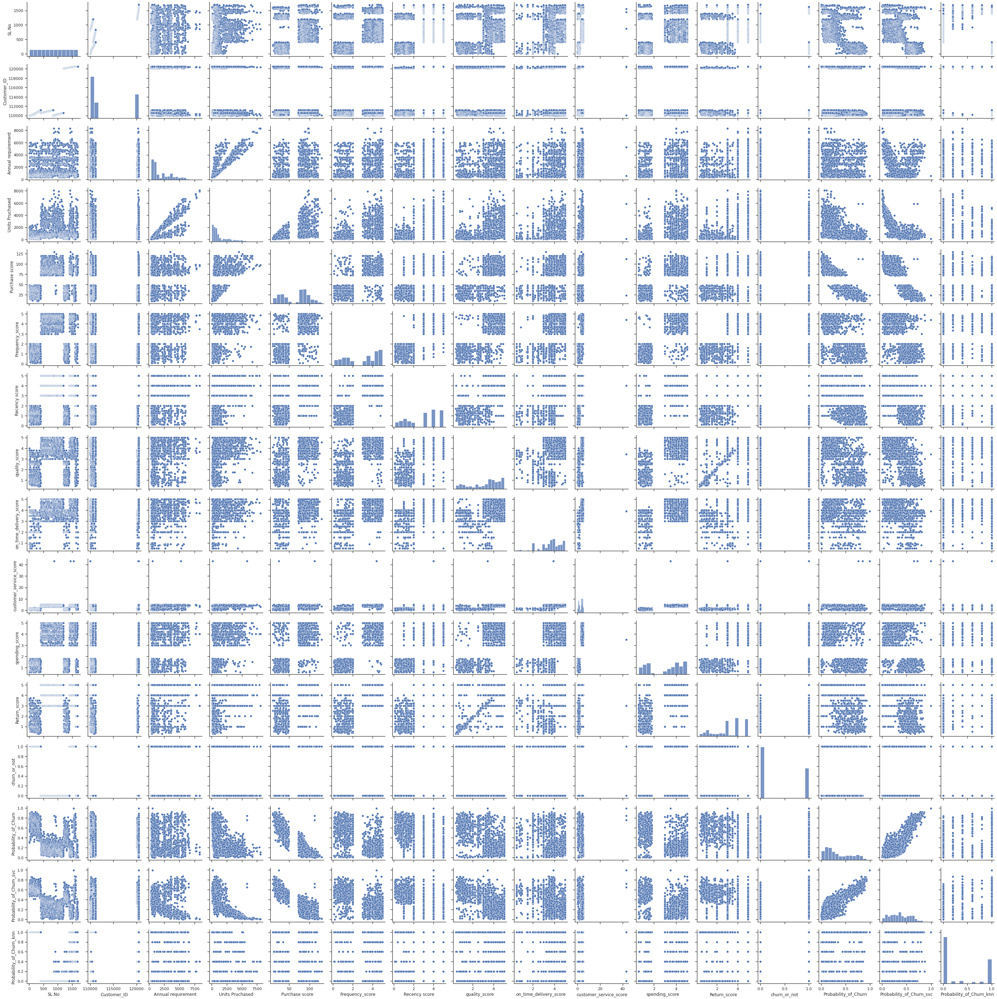

In [146]:
import seaborn as sns
%matplotlib inline
plt.rcParams['figure.figsize']=20,20

sns.set(style="ticks", color_codes=True)
g = sns.pairplot(churn_dataset)


import matplotlib.pyplot as plt
plt.show()


In [86]:
churn_dataset.shape

(1700, 13)

In [87]:
#churn_dataset.loc[churn_dataset.Churn=='No','Churn'] = 0 
#churn_dataset.loc[churn_dataset.Churn=='Yes','Churn'] = 1

In [88]:
churn_dataset["churn_or_not"].value_counts().values


array([1074,  626])

In [89]:
# Replace all the spaces with null values
churn_dataset['customer_service_score'] = churn_dataset["customer_service_score"].replace(" ",np.nan)

# Drop null values of 'Total Charges' feature
churn_dataset = churn_dataset[churn_dataset["customer_service_score"].notnull()]
churn_dataset = churn_dataset.reset_index()[churn_dataset.columns]

# Convert 'Total Charges' column values to float data type
churn_dataset["customer_service_score"] = churn_dataset["customer_service_score"].astype(float)

In [90]:
plot_by_churn_labels = churn_dataset["churn_or_not"].value_counts().keys().tolist()
plot_by_churn_values = churn_dataset["churn_or_not"].value_counts().values.tolist()

plot_data= [
    go.Pie(labels = plot_by_churn_labels,
           values = plot_by_churn_values,
           marker = dict(colors =  [ 'Teal' ,'Grey'],
                         line = dict(color = "white",
                                     width =  1.5)),
           rotation = 90,
           hoverinfo = "label+value+text",
           hole = .6)
]
plot_layout = go.Layout(dict(title = "Customer Churn",
                   plot_bgcolor  = "rgb(243,243,243)",
                   paper_bgcolor = "rgb(243,243,243)",))


fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)


In [91]:
plot_by_quality = churn_dataset.groupby('quality_score').churn_or_not.mean().reset_index()
plot_data = [
    go.Bar(
        x=plot_by_quality['quality_score'],
        y=plot_by_quality['churn_or_not'],
        width = [0.6, 0.6],
        marker=dict(
        color=['orange', 'green'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='Churn Rate by Quality',
        plot_bgcolor  = 'rgb(243,243,243)',
        paper_bgcolor  = 'rgb(243,243,243)',
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [92]:
plot_by_delivery = churn_dataset.groupby('on_time_delivery_score').churn_or_not.mean().reset_index()
plot_data = [
    go.Bar(
        x=plot_by_delivery['on_time_delivery_score'],
        y=plot_by_delivery['churn_or_not'],
        width = [0.6, 0.6],
        marker=dict(
        color=['orange', 'green'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='Churn Rate by Delivery',
        plot_bgcolor  = 'rgb(243,243,243)',
        paper_bgcolor  = 'rgb(243,243,243)',
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [93]:
plot_by_customer_service = churn_dataset.groupby('customer_service_score').churn_or_not.mean().reset_index()
plot_data = [
    go.Bar(
        x=plot_by_customer_service['customer_service_score'],
        y=plot_by_customer_service['churn_or_not'],
        width = [0.6, 0.6],
        marker=dict(
        color=['orange', 'green'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='Churn Rate by Customer_service',
        plot_bgcolor  = 'rgb(243,243,243)',
        paper_bgcolor  = 'rgb(243,243,243)',
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [94]:
plot_by_Frequency_score = churn_dataset.groupby('Frequency_score').churn_or_not.mean().reset_index()
plot_data = [
    go.Bar(
        x=plot_by_Frequency_score['Frequency_score'],
        y=plot_by_Frequency_score['churn_or_not'],
        width = [0.3, 0.3],
        marker=dict(
        color=['orange', 'green'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='Churn Rate by Frequency_score',
        plot_bgcolor  = 'rgb(243,243,243)',
        paper_bgcolor  = 'rgb(243,243,243)',
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [95]:
plot_by_Purchase_score = churn_dataset.groupby('Purchase score').churn_or_not.mean().reset_index()
plot_data = [
    go.Bar(
        x=plot_by_Purchase_score['Purchase score'],
        y=plot_by_Purchase_score['churn_or_not'],
        width = [0.6, 0.6],
        marker=dict(
        color=['orange', 'green'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='Churn Rate by Purchase score',
        plot_bgcolor  = 'rgb(243,243,243)',
        paper_bgcolor  = 'rgb(243,243,243)',
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [96]:
plot_by_Recency_score = churn_dataset.groupby('Recency score').churn_or_not.mean().reset_index()
plot_data = [
    go.Bar(
        x=plot_by_Recency_score['Recency score'],
        y=plot_by_Recency_score['churn_or_not'],
        width = [0.6, 0.6],
        marker=dict(
        color=['orange', 'green'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='Churn Rate by Recency score',
        plot_bgcolor  = 'rgb(243,243,243)',
        paper_bgcolor  = 'rgb(243,243,243)',
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [97]:
plot_by_spending_score = churn_dataset.groupby('spending_score').churn_or_not.mean().reset_index()
plot_data = [
    go.Bar(
        x=plot_by_spending_score['spending_score'],
        y=plot_by_spending_score['churn_or_not'],
        width = [0.6, 0.6],
        marker=dict(
        color=['orange', 'green'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='Churn Rate by spending score',
        plot_bgcolor  = 'rgb(243,243,243)',
        paper_bgcolor  = 'rgb(243,243,243)',
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [98]:
plot_by_Return_score = churn_dataset.groupby('Return_score').churn_or_not.mean().reset_index()
plot_data = [
    go.Bar(
        x=plot_by_Return_score['Return_score'],
        y=plot_by_Return_score['churn_or_not'],
        width = [0.6, 0.6],
        marker=dict(
        color=['orange', 'green'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='Churn Rate by Return_score',
        plot_bgcolor  = 'rgb(243,243,243)',
        paper_bgcolor  = 'rgb(243,243,243)',
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [99]:
y = churn_dataset['churn_or_not']
X = churn_dataset.drop(['churn_or_not','Customer_ID'], axis = 1)

In [100]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 50)

In [101]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

In [102]:
logmodel = LogisticRegression(random_state=50)
logmodel.fit(X_train,y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=50, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [103]:
pred = logmodel.predict(X_test)


In [104]:
logmodel_accuracy = round(metrics.accuracy_score(y_test, pred) * 100, 2)

In [105]:
svcmodel = SVC(kernel='linear', random_state=50, probability=True)
svcmodel.fit(X_train,y_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='linear',
    max_iter=-1, probability=True, random_state=50, shrinking=True, tol=0.001,
    verbose=False)

In [106]:
svc_pred = svcmodel.predict(X_test)

In [107]:
svc_accuracy = round(metrics.accuracy_score(y_test, svc_pred) * 100, 2)

In [108]:
from sklearn.neighbors import KNeighborsClassifier
knnmodel = KNeighborsClassifier(n_neighbors=5, metric='minkowski', p=2) #p=2 represents Euclidean distance, p=1 represents Manhattan Distance
knnmodel.fit(X_train, y_train) 
  
#Predict the value for new, unseen data
knn_pred = knnmodel.predict(X_test)

# Find Accuracy using accuracy_score method
knn_accuracy = round(metrics.accuracy_score(y_test, knn_pred) * 100, 2)

In [109]:
from sklearn.tree import DecisionTreeClassifier
dtmodel = DecisionTreeClassifier(criterion = "gini", random_state = 50)
dtmodel.fit(X_train, y_train) 
  
#Predict the value for new, unseen data
dt_pred = dtmodel.predict(X_test)

# Find Accuracy using accuracy_score method
dt_accuracy = round(metrics.accuracy_score(y_test, dt_pred) * 100, 2)

In [110]:
from sklearn.ensemble import RandomForestClassifier
rfmodel = RandomForestClassifier(n_estimators = 100, criterion = 'entropy', random_state = 0)
rfmodel.fit(X_train, y_train) 
  
#Predict the value for new, unseen data
rf_pred = rfmodel.predict(X_test)

# Find Accuracy using accuracy_score method
rf_accuracy = round(metrics.accuracy_score(y_test, rf_pred) * 100, 2)

In [113]:
Model_Comparison = pd.DataFrame({
    'Model': ['Logistic Regression', 'Support Vector Machine', 'K-Nearest Neighbor', 
              'Decision Tree', 'Random Forest'],
    'Score': [logmodel_accuracy, svc_accuracy, knn_accuracy, 
              dt_accuracy, rf_accuracy]})
Model_Comparison_df = Model_Comparison.sort_values(by='Score', ascending=False)
Model_Comparison_df = Model_Comparison_df.set_index('Score')
Model_Comparison_df.reset_index()

,Score,Model
0,100.00,Decision Tree
1,100.00,Random Forest
2,94.31,K-Nearest Neighbor
3,84.90,Support Vector Machine
4,80.00,Logistic Regression


In [114]:
from sklearn.metrics import confusion_matrix
conf_mat_logmodel = confusion_matrix(y_test,pred)
conf_mat_logmodel

array([[274,  30],
       [ 72, 134]])

In [115]:
churn_dataset['Probability_of_Churn'] = logmodel.predict_proba(churn_dataset[X_test.columns])[:,1]

In [148]:
churn_testdata = pd.read_excel('/content/churn_testdata.xlsx')

In [149]:
churn_testdata['Probability_of_Churn'] = logmodel.predict_proba(churn_testdata[X_test.columns])[:,1]

In [150]:
churn_testdata[['Customer_ID','Probability_of_Churn']].head()

,Customer_ID,Probability_of_Churn
0,120601,0.454009
1,120602,0.455171
2,120603,0.381061
3,120604,0.413205
4,120605,0.158425


In [117]:
churn_dataset['Probability_of_Churn_svc'] = svcmodel.predict_proba(churn_dataset[X_test.columns])[:,1]

In [151]:
churn_testdata['Probability_of_Churn_svc'] = svcmodel.predict_proba(churn_testdata[X_test.columns])[:,1]

In [152]:
churn_testdata[['Customer_ID','Probability_of_Churn_svc']].head()

,Customer_ID,Probability_of_Churn_svc
0,120601,0.448377
1,120602,0.376921
2,120603,0.455486
3,120604,0.333109
4,120605,0.275213


In [118]:
churn_dataset[['Customer_ID','Probability_of_Churn_svc']].head()

,Customer_ID,Probability_of_Churn_svc
0,110005,0.645824
1,110008,0.719994
2,110009,0.626717
3,110011,0.610069
4,110013,0.686542


In [119]:
churn_dataset['Probability_of_Churn_knn'] = knnmodel.predict_proba(churn_dataset[X_test.columns])[:,1]

In [153]:
churn_testdata['Probability_of_Churn_knn'] = knnmodel.predict_proba(churn_testdata[X_test.columns])[:,1]

In [155]:
churn_testdata[['Customer_ID','Probability_of_Churn_knn']].head(20)

,Customer_ID,Probability_of_Churn_knn
0,120601,0.8
1,120602,1.0
2,120603,1.0
3,120604,1.0
4,120605,0.2
5,120606,0.8
6,120607,0.6
7,120608,0.4
8,120609,1.0
9,120610,1.0


In [157]:
churn_testdata.to_csv('Churn_prediction_unknown_data.csv')

In [120]:
churn_dataset[['Customer_ID','Probability_of_Churn_knn']].tail(20)

,Customer_ID,Probability_of_Churn_knn
1678,120474,0.0
1679,120474,0.4
1680,120474,0.8
1681,120474,1.0
1682,120474,0.8
1683,120474,0.2
1684,120474,0.0
1685,120474,0.0
1686,120474,0.4
1687,120474,0.4


In [121]:
pip install chart_studio

In [122]:
import chart_studio as cs
import plotly.offline as po
import plotly.graph_objs as gobj

<Figure size 504x504 with 0 Axes>

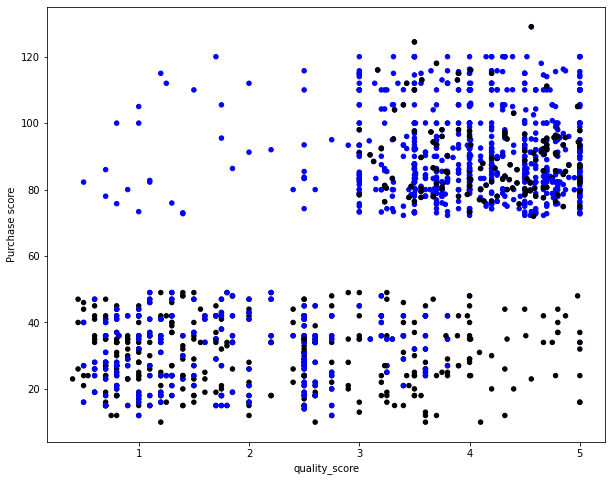

In [124]:
from matplotlib import pyplot as plt
plt.figure(figsize=(7,7))

##Scatter Plot Frequency Vs Recency
Colors = ["blue", "black"]
churn_dataset['Color'] = churn_dataset['churn_or_not'].map(lambda p: Colors[p])
ax = churn_dataset.plot(    
    kind="scatter", 
    x="quality_score", y="Purchase score",
    figsize=(10,8),
    c = churn_dataset['Color']
)

In [125]:
churn_dataset.to_csv('churn_dataset_probability.csv')

<Figure size 504x504 with 0 Axes>

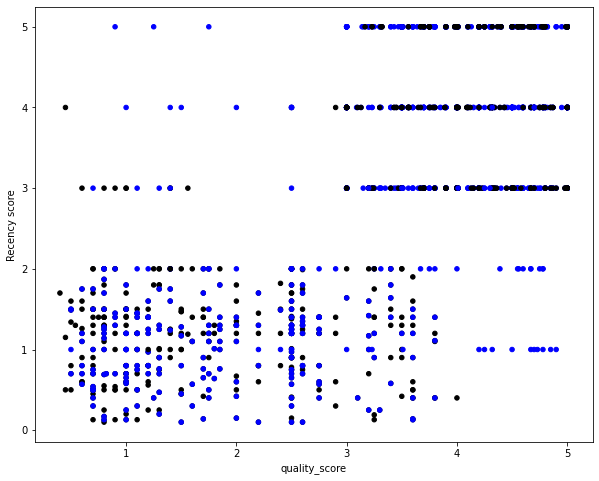

In [127]:
from matplotlib import pyplot as plt
plt.figure(figsize=(7,7))

##Scatter Plot Frequency Vs Recency
Colors = ["blue", "black"]
churn_dataset['Color'] = churn_dataset['churn_or_not'].map(lambda p: Colors[p])
ax = churn_dataset.plot(    
    kind="scatter", 
    x="quality_score", y="Recency score",
    figsize=(10,8),
    c = churn_dataset['Color']
)

<Figure size 504x504 with 0 Axes>

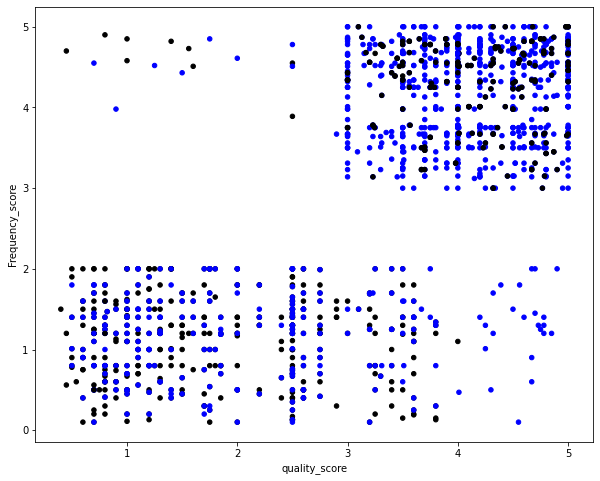

In [129]:
from matplotlib import pyplot as plt
plt.figure(figsize=(7,7))

##Scatter Plot Frequency Vs Recency
Colors = ["blue", "black"]
churn_dataset['Color'] = churn_dataset['churn_or_not'].map(lambda p: Colors[p])
ax = churn_dataset.plot(    
    kind="scatter", 
    x="quality_score", y="Frequency_score",
    figsize=(10,8),
    c = churn_dataset['Color']
)

<Figure size 504x504 with 0 Axes>

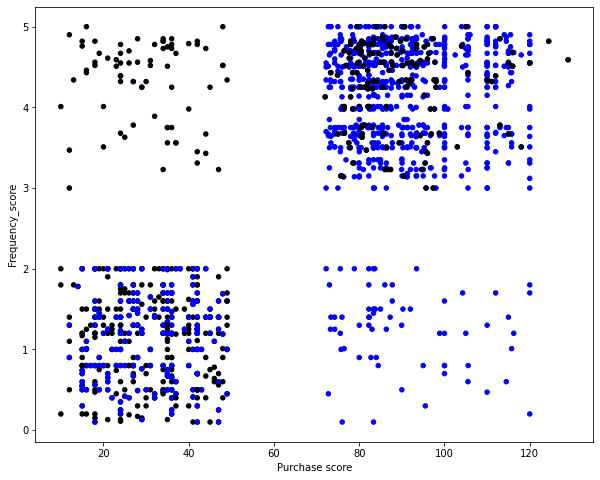

In [130]:
from matplotlib import pyplot as plt
plt.figure(figsize=(7,7))

##Scatter Plot Frequency Vs Recency
Colors = ["blue", "black"]
churn_dataset['Color'] = churn_dataset['churn_or_not'].map(lambda p: Colors[p])
ax = churn_dataset.plot(    
    kind="scatter", 
    x="Purchase score", y="Frequency_score",
    figsize=(10,8),
    c = churn_dataset['Color']
)

<Figure size 504x504 with 0 Axes>

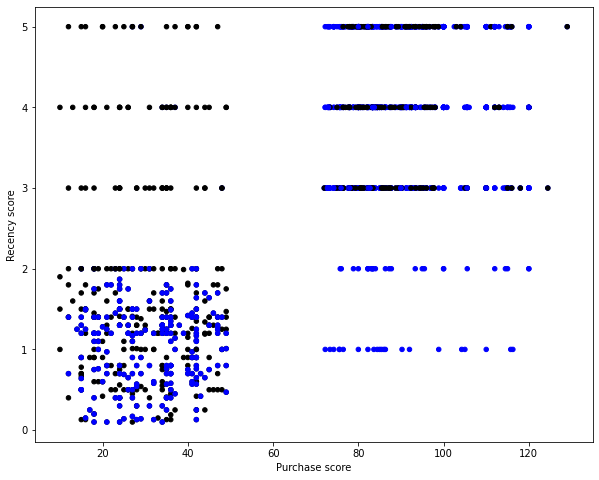

In [132]:
from matplotlib import pyplot as plt
plt.figure(figsize=(7,7))

##Scatter Plot Frequency Vs Recency
Colors = ["blue", "black"]
churn_dataset['Color'] = churn_dataset['churn_or_not'].map(lambda p: Colors[p])
ax = churn_dataset.plot(    
    kind="scatter", 
    x="Purchase score", y="Recency score",
    figsize=(10,8),
    c = churn_dataset['Color']
)

<Figure size 504x504 with 0 Axes>

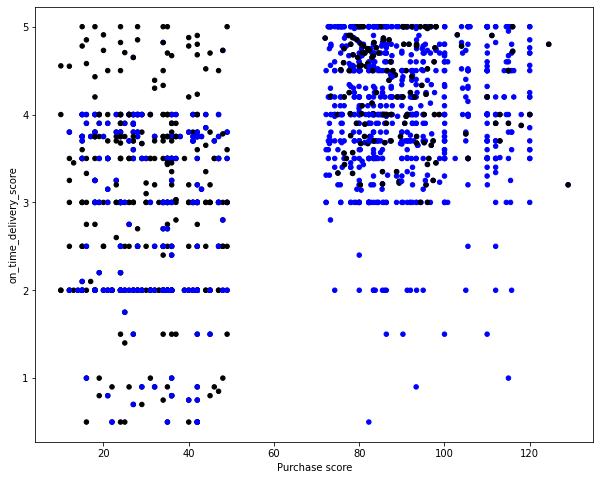

In [133]:
from matplotlib import pyplot as plt
plt.figure(figsize=(7,7))

##Scatter Plot Frequency Vs Recency
Colors = ["blue", "black"]
churn_dataset['Color'] = churn_dataset['churn_or_not'].map(lambda p: Colors[p])
ax = churn_dataset.plot(    
    kind="scatter", 
    x="Purchase score", y="on_time_delivery_score",
    figsize=(10,8),
    c = churn_dataset['Color']
)

<Figure size 504x504 with 0 Axes>

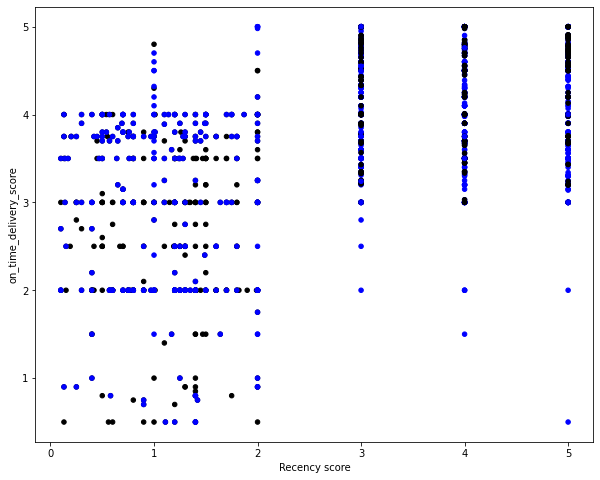

In [134]:
from matplotlib import pyplot as plt
plt.figure(figsize=(7,7))

##Scatter Plot Frequency Vs Recency
Colors = ["blue", "black"]
churn_dataset['Color'] = churn_dataset['churn_or_not'].map(lambda p: Colors[p])
ax = churn_dataset.plot(    
    kind="scatter", 
    x="Recency score", y="on_time_delivery_score",
    figsize=(10,8),
    c = churn_dataset['Color']
)

<Figure size 504x504 with 0 Axes>

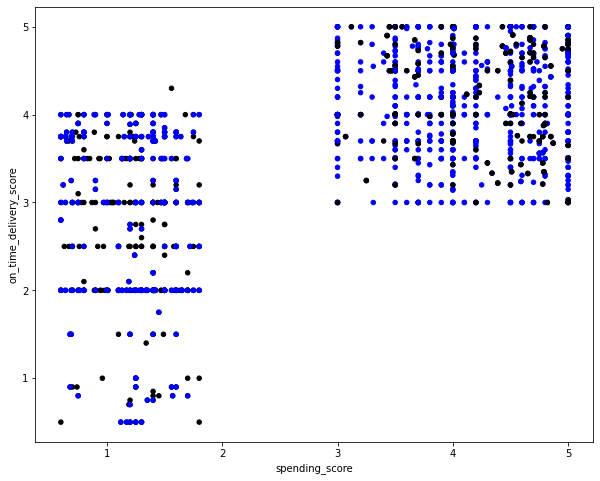

In [135]:
from matplotlib import pyplot as plt
plt.figure(figsize=(7,7))

##Scatter Plot Frequency Vs Recency
Colors = ["blue", "black"]
churn_dataset['Color'] = churn_dataset['churn_or_not'].map(lambda p: Colors[p])
ax = churn_dataset.plot(    
    kind="scatter", 
    x="spending_score", y="on_time_delivery_score",
    figsize=(10,8),
    c = churn_dataset['Color']
)